In [17]:
from collections import defaultdict
import torch
import tqdm
import wandb
import os



import utils
import lkis as LKIS
from datasets import Collator

from torch_pca import PCA
import os

from torchvision.datasets.imagenet import ImageFolder
from torchvision.datasets import CIFAR100
from torch.utils.data import DataLoader

from transformers import ViTForImageClassification, AutoImageProcessor , ViTImageProcessor
from models.ode_transformer_gpt  import ViTNeuralODE
import numpy as np
import scienceplots

from torchdiffeq import odeint
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from matplotlib.lines import Line2D
import seaborn as sns
from sklearn.manifold import TSNE


In [18]:
def plot_trajectories_comparison(teacher_trajectories, student_trajectories, 
                               reduction_method='pca', figsize=(15, 10)):
    """
    Plot trajectories from teacher and student models in the same plot.
    
    Args:
        teacher_trajectories: torch.Tensor of shape [B, T1, D] - teacher model trajectories
        student_trajectories: torch.Tensor of shape [B, T2, D] - student model trajectories  
        reduction_method: str - 'pca' or 'tsne' for dimensionality reduction
        figsize: tuple - figure size
    """
    # Convert to numpy
    teacher_traj = teacher_trajectories.detach().cpu().numpy()
    student_traj = student_trajectories.detach().cpu().numpy()
    
    B, T1, D = teacher_traj.shape
    _, T2, _ = student_traj.shape
    
    # Reshape for dimensionality reduction: [B*T1 + B*T2, D]
    teacher_flat = teacher_traj.reshape(-1, D)
    student_flat = student_traj.reshape(-1, D)
    all_points = np.concatenate([teacher_flat, student_flat], axis=0)
    
    # Apply dimensionality reduction
    if reduction_method == 'pca':
        reducer = PCA(n_components=2, random_state=42)
        reduced_points = reducer.fit_transform(all_points)
        title_suffix = f"PCA (explained variance: {reducer.explained_variance_ratio_.sum():.2f})"
    elif reduction_method == 'tsne':
        reducer = TSNE(n_components=2, random_state=42, perplexity=min(30, len(all_points)//4))
        reduced_points = reducer.fit_transform(all_points)
        title_suffix = "t-SNE"
    
    # Split back into teacher and student
    teacher_2d = reduced_points[:B*T1].reshape(B, T1, 2)
    student_2d = reduced_points[B*T1:].reshape(B, T2, 2)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Color palette for different samples
    colors = plt.cm.Set3(np.linspace(0, 1, B))
    
    # Plot trajectories
    for i in range(B):
        # Teacher trajectory (solid line)
        ax.plot(teacher_2d[i, :, 0], teacher_2d[i, :, 1], 
                color=colors[i], linewidth=2.5, alpha=0.8, 
                linestyle='-', label=f'Teacher Sample {i+1}' if i < 5 else "")
        
        # Student trajectory (dashed line, same color)
        ax.plot(student_2d[i, :, 0], student_2d[i, :, 1], 
                color=colors[i], linewidth=2.5, alpha=0.8, 
                linestyle='--', label=f'Student Sample {i+1}' if i < 5 else "")
        
        # Mark start points (circles)
        ax.scatter(teacher_2d[i, 0, 0], teacher_2d[i, 0, 1], 
                  color=colors[i], s=80, marker='o', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
        ax.scatter(student_2d[i, 0, 0], student_2d[i, 0, 1], 
                  color=colors[i], s=80, marker='s', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
        
        # Mark end points (stars)
        ax.scatter(teacher_2d[i, -1, 0], teacher_2d[i, -1, 1], 
                  color=colors[i], s=120, marker='*', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
        ax.scatter(student_2d[i, -1, 0], student_2d[i, -1, 1], 
                  color=colors[i], s=120, marker='P', edgecolor='black', 
                  linewidth=1.5, alpha=0.9)
    
    # Create custom legend
    legend_elements = [
        Line2D([0], [0], color='black', linewidth=2, linestyle='-', label='Teacher Trajectory'),
        Line2D([0], [0], color='black', linewidth=2, linestyle='--', label='Student Trajectory'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
               markersize=8, label='Start (Teacher)', markeredgecolor='black'),
        Line2D([0], [0], marker='s', color='w', markerfacecolor='gray', 
               markersize=8, label='Start (Student)', markeredgecolor='black'),
        Line2D([0], [0], marker='*', color='w', markerfacecolor='gray', 
               markersize=10, label='End (Teacher)', markeredgecolor='black'),
        Line2D([0], [0], marker='P', color='w', markerfacecolor='gray', 
               markersize=10, label='End (Student)', markeredgecolor='black')
    ]
    
    ax.legend(handles=legend_elements, loc='upper right', frameon=True, 
              fancybox=True, shadow=True)
    
    ax.set_title(f'Teacher vs Student Model Trajectories Comparison\n({title_suffix}) - T_teacher={T1}, T_student={T2}', 
                 fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Component 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Component 2', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_facecolor('#f8f9fa')
    
    plt.tight_layout()
    return fig



def plot_final_states_scatter(teacher_trajectories, student_trajectories, 
                            acc_t, acc_edo, agreement, reduction_method='pca', 
                            figsize=(12, 10)):
    """
    Scatter plot of final hidden states with distance lines and classification indicators.
    
    Args:
        teacher_trajectories: torch.Tensor - teacher trajectories [B, T1, D]
        student_trajectories: torch.Tensor - student trajectories [B, T2, D]
        acc_t: list - teacher model accuracy for each sample
        acc_edo: list - student model accuracy for each sample
        agreement: list - agreement between models for each sample
        reduction_method: str - 'pca' or 'tsne'
        figsize: tuple - figure size
    """
    # Get final states (last time step)
    teacher_final = teacher_trajectories[:, -1, :].detach().cpu().numpy()
    student_final = student_trajectories[:, -1, :].detach().cpu().numpy()
    
    # Combine for dimensionality reduction
    all_final_states = np.concatenate([teacher_final, student_final], axis=0)
    
    if reduction_method == 'pca':
        reducer = PCA(n_components=2, random_state=42)
        reduced_states = reducer.fit_transform(all_final_states)
        title_suffix = f"PCA (explained variance: {reducer.explained_variance_ratio_.sum():.2f})"
    elif reduction_method == 'tsne':
        reducer = TSNE(n_components=2, random_state=42, perplexity=min(30, len(all_final_states)//4))
        reduced_states = reducer.fit_transform(all_final_states)
        title_suffix = "t-SNE"
    
    # Split back
    B = len(teacher_final)
    teacher_final_2d = reduced_states[:B]
    student_final_2d = reduced_states[B:]
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Determine colors and markers based on accuracy and agreement
    for i in range(B):
        # Determine color based on classification correctness
        both_correct = acc_t[i] == 1 and acc_edo[i] == 1
        both_wrong = acc_t[i] == 0 and acc_edo[i] == 0
        disagreement = acc_t[i] != acc_edo[i]
        
        if both_correct:
            color = 'green'
        elif both_wrong:
            color = 'red'
        else:  # disagreement
            color = 'orange'
        
        # Determine marker based on agreement
        if agreement[i] == 1:
            teacher_marker = 'o'
            student_marker = 'o'
        else:
            teacher_marker = '^'
            student_marker = 's'
        
        # Plot teacher point
        ax.scatter(teacher_final_2d[i, 0], teacher_final_2d[i, 1], 
                  color=color, s=120, marker=teacher_marker, 
                  edgecolor='black', linewidth=2, alpha=0.8,
                  label='Teacher' if i == 0 else "")
        
        # Plot student point  
        ax.scatter(student_final_2d[i, 0], student_final_2d[i, 1], 
                  color=color, s=120, marker=student_marker, 
                  edgecolor='white', linewidth=2, alpha=0.8,
                  label='Student' if i == 0 else "")
        
        # Draw line between corresponding points
        ax.plot([teacher_final_2d[i, 0], student_final_2d[i, 0]], 
                [teacher_final_2d[i, 1], student_final_2d[i, 1]], 
                color=color, alpha=0.6, linewidth=1.5, linestyle=':')
        
        # Add sample number annotation
        mid_x = (teacher_final_2d[i, 0] + student_final_2d[i, 0]) / 2
        mid_y = (teacher_final_2d[i, 1] + student_final_2d[i, 1]) / 2
        ax.annotate(f'{i+1}', (mid_x, mid_y), fontsize=9, ha='center', va='center',
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))
    
    # Create comprehensive legend
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='green', 
               markersize=10, label='Both Correct', markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='red', 
               markersize=10, label='Both Wrong', markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', 
               markersize=10, label='Disagreement', markeredgecolor='black'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
               markersize=10, label='Agreement (same marker)', markeredgecolor='black'),
        Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', 
               markersize=10, label='No Agreement (diff markers)', markeredgecolor='black'),
        Line2D([0], [0], color='gray', linewidth=2, linestyle=':', label='Distance Line')
    ]
    
    ax.legend(handles=legend_elements, loc='upper right', frameon=True, 
              fancybox=True, shadow=True)
    
    ax.set_title(f'Final Hidden States Comparison\n({title_suffix})', 
                 fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('Component 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Component 2', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_facecolor('#f8f9fa')
    
    plt.tight_layout()
    return fig


def plot_distance_distributions(teacher_trajectories, student_trajectories, 
                               acc_t, acc_edo, agreement, figsize=(15, 5)):
    """
    Plot distributions of distances between final teacher and student states.
    
    Args:
        teacher_trajectories: torch.Tensor - teacher trajectories [B, T1, D]
        student_trajectories: torch.Tensor - student trajectories [B, T2, D]
        acc_t: list - teacher model accuracy
        acc_edo: list - student model accuracy  
        agreement: list - agreement between models
        figsize: tuple - figure size
    """
    # Calculate distances between final states
    teacher_final = teacher_trajectories[:, -1, :].detach().cpu()
    student_final = student_trajectories[:, -1, :].detach().cpu()
    
    distances = torch.norm(teacher_final - student_final, dim=1).numpy()
    
    # Categorize distances
    both_correct_distances = []
    both_wrong_distances = []
    disagreement_distances = []
    agreement_distances = []
    no_agreement_distances = []
    
    for i in range(len(distances)):
        dist = distances[i]
        
        # Classification-based categorization
        if acc_t[i] == 1 and acc_edo[i] == 1:
            both_correct_distances.append(dist)
        elif acc_t[i] == 0 and acc_edo[i] == 0:
            both_wrong_distances.append(dist)
        else:
            disagreement_distances.append(dist)
        
        # Agreement-based categorization
        if agreement[i] == 1:
            agreement_distances.append(dist)
        else:
            no_agreement_distances.append(dist)
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Plot 1: Distribution by classification correctness
    ax1.hist([both_correct_distances, both_wrong_distances, disagreement_distances], 
             bins=15, alpha=0.7, label=['Both Correct', 'Both Wrong', 'Disagreement'],
             color=['green', 'red', 'orange'], density=True, edgecolor='black')
    
    ax1.set_title('Distance Distribution by Classification', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Distance between Final States', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Density', fontsize=12, fontweight='bold')
    ax1.legend(frameon=True, fancybox=True, shadow=True)
    ax1.grid(True, alpha=0.3)
    ax1.set_facecolor('#f8f9fa')
    
    # Add statistics text
    stats_text = f'Both Correct: μ={np.mean(both_correct_distances):.3f}, σ={np.std(both_correct_distances):.3f}\n'
    stats_text += f'Both Wrong: μ={np.mean(both_wrong_distances):.3f}, σ={np.std(both_wrong_distances):.3f}\n'
    stats_text += f'Disagreement: μ={np.mean(disagreement_distances):.3f}, σ={np.std(disagreement_distances):.3f}'
    ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes, fontsize=9,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 2: Distribution by agreement
    ax2.hist([agreement_distances, no_agreement_distances], 
             bins=15, alpha=0.7, label=['Agreement', 'No Agreement'],
             color=['blue', 'purple'], density=True, edgecolor='black')
    
    ax2.set_title('Distance Distribution by Model Agreement', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Distance between Final States', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Density', fontsize=12, fontweight='bold')
    ax2.legend(frameon=True, fancybox=True, shadow=True)
    ax2.grid(True, alpha=0.3)
    ax2.set_facecolor('#f8f9fa')
    
    # Add statistics text
    stats_text2 = f'Agreement: μ={np.mean(agreement_distances):.3f}, σ={np.std(agreement_distances):.3f}\n'
    stats_text2 += f'No Agreement: μ={np.mean(no_agreement_distances):.3f}, σ={np.std(no_agreement_distances):.3f}'
    ax2.text(0.02, 0.98, stats_text2, transform=ax2.transAxes, fontsize=9,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    return fig

In [19]:
# Set Matplotlib style
plt.style.use("science")
plt.rcParams['text.usetex'] = False

plt.rcParams.update(
    {
        "font.size": 12,
        "axes.titlesize": 14,
        "axes.labelsize": 13,
        "legend.fontsize": 11,
        "figure.dpi": 300,
    }
)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ["TOKENIZERS_PARALLELISM"] = "false"
os.environ["CUDA_VISIBLE_DEVICES"]= "0"


In [20]:
EDO_CHECKPOINT_PATH = "/data/users/cboned/checkpoints/VIT_ODE_CIFAR100.pt"
TEACHER_CHECKPOINT_PATH = "checkpoints/Vit_CIFAR100.pt"
DATASET_PATH = "/data/users/cboned/data/Generic/cifar"

In [21]:
train_dataset = CIFAR100(root=DATASET_PATH, download=False, train=True)
validation_dataset = CIFAR100(root=DATASET_PATH, download=False, train=False)


In [22]:


processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224-in21k')
collator = Collator(processor)
train_dloader = DataLoader(train_dataset, 
                           shuffle=False,
                           batch_size=1,
                           pin_memory=False,
                           num_workers=8,
                           collate_fn=collator.classification_collate_fn
                           )


test_dloader = DataLoader(validation_dataset,
                          batch_size=1,
                          pin_memory=False,
                          num_workers=0,
                          shuffle=False,
                          collate_fn=collator.classification_collate_fn

)


In [23]:
model = ViTNeuralODE(
    img_size=224,
    patch_size=16,
    in_chans=3,
    num_classes=100,
    embed_dim=768,
    num_heads=8,
    mlp_ratio=1.0,
    emulate_depth=12.0,
    time_interval=1.0,   # match 12 "layers" by integrating over [0,12]
    num_eval_steps=24,
    solver="euler",
)

weight_to_update = torch.load(EDO_CHECKPOINT_PATH, weights_only=True)
for w in weight_to_update.keys():
    if model.state_dict().get(w) is not None:
        model.state_dict()[w].data.copy_(weight_to_update[w])
                
model = model.to(device)
teacher_model = ViTForImageClassification.from_pretrained(TEACHER_CHECKPOINT_PATH).to(device)

model.cls_token = teacher_model.vit.embeddings.cls_token

model = model.eval()
teacher_model = teacher_model.eval()


In [24]:
LABEL_TO_EVALUATE = 1

In [25]:
feats = []
teacher_feats = []
lab = []

acc_t = []
acc_edo = []
aggrement = []

for batch_idx, data in tqdm.tqdm(
    enumerate(test_dloader),
    desc="Extracting the PCA Vt for computing the trajectories",
    total=len(test_dloader),
):
    
    inputs: dict = data["pixel_values"].to(device)
    labels: list = data["labels"]

    if labels.item() == LABEL_TO_EVALUATE:
        lab.append(labels.numpy())

        labels = labels.to(device)
        with torch.no_grad():
            output_t = teacher_model(**inputs, output_hidden_states=True)
            hidden_states = torch.stack(output_t["hidden_states"])
            logits_t = output_t["logits"]
            
            pred_t = logits_t.argmax(-1)
            acc_t.append((pred_t == labels).int().item())
            

            last_points = hidden_states[:, :, 0]
            output_edo = model(**inputs, labels=labels, return_hidden_states=True)
            states = output_edo["states"]
            logits_edo = output_edo["logits"]
            
            pred_edo = logits_edo.argmax(-1)
            acc_edo.append((pred_edo == labels).int().item())

            aggrement.append((pred_edo == pred_t).int().item())
            
            
            teacher_feats.append(last_points)
            feats.append(states[:, :, 0])
            

print(f"Aggrement Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(aggrement)}")
print(f"Accuracy EDO Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_edo)}")
print(f"Accuracy TEACHER Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_t)}")
    

Extracting the PCA Vt for computing the trajectories: 100%|██████████| 10000/10000 [00:37<00:00, 263.51it/s]

Aggrement Evaluating CLASS: 1: 0.72
Accuracy EDO Evaluating CLASS: 1: 0.72
Accuracy TEACHER Evaluating CLASS: 1: 0.96


In [26]:
len(lab)

100

In [27]:
print(np.mean(aggrement))
print(np.mean(acc_edo))
print(np.mean(acc_t))

0.72
0.72
0.96


In [28]:
(feats[0].shape)

torch.Size([24, 1, 768])

In [29]:
trajectories = torch.stack(feats, dim=0).squeeze(2)
teacher_trajectories = torch.stack(teacher_feats, dim=0).squeeze(2)
print(trajectories.shape)
print(teacher_trajectories.shape)

torch.Size([100, 24, 768])
torch.Size([100, 13, 768])


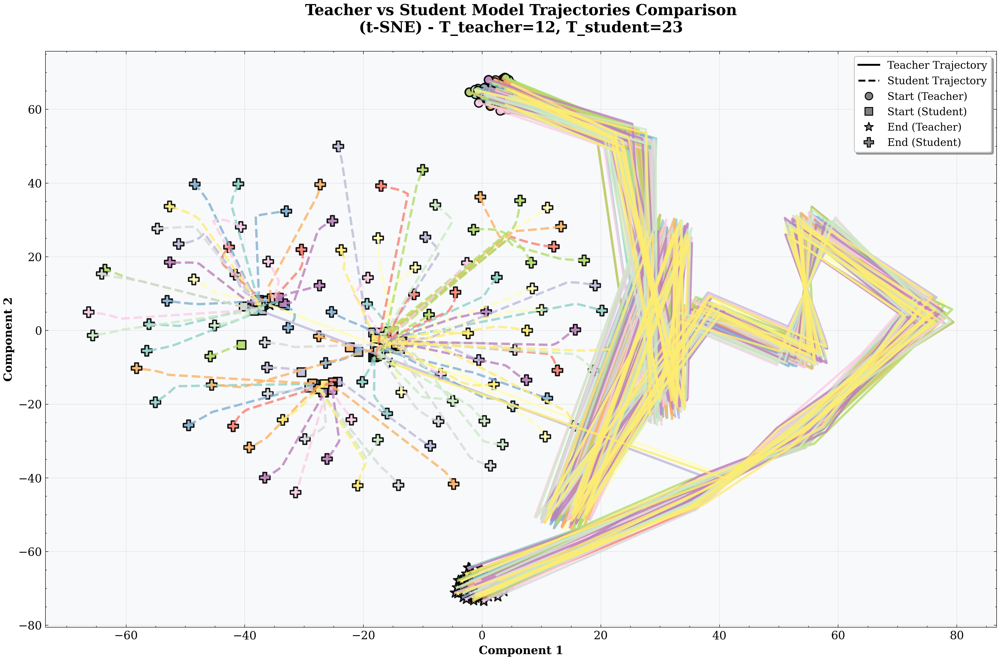

In [31]:
fig1 = plot_trajectories_comparison(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], reduction_method="tsne")


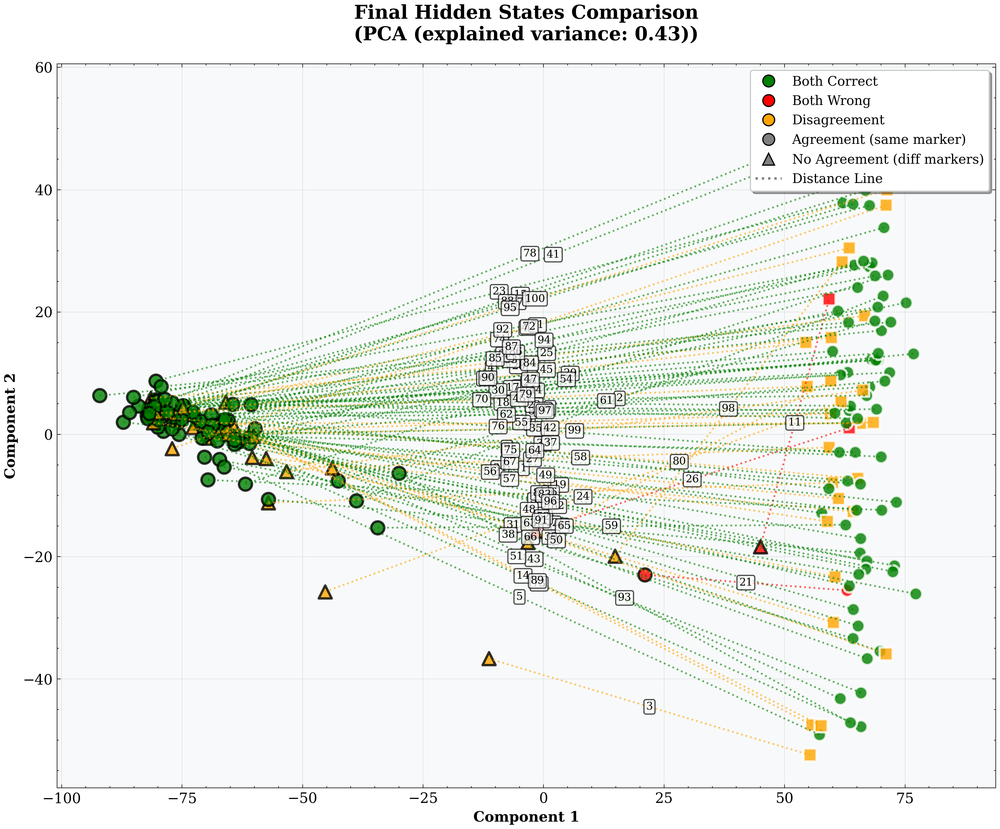

In [32]:
fig2 = plot_final_states_scatter(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement)

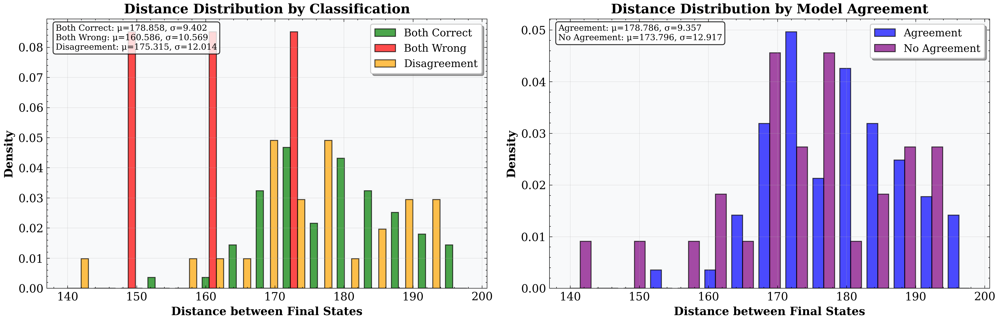

In [33]:
fig3 = plot_distance_distributions(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement)

In [40]:
feats = []
teacher_feats = []
lab = []

acc_t = []
acc_edo = []
aggrement = []

for batch_idx, data in tqdm.tqdm(
    enumerate(test_dloader),
    desc="Extracting the PCA Vt for computing the trajectories",
    total=len(test_dloader),
):
    
    inputs: dict = data["pixel_values"].to(device)
    labels: list = data["labels"]

    if labels.item() == LABEL_TO_EVALUATE:
        lab.append(labels.numpy())

        labels = labels.to(device)
        with torch.no_grad():
            output_t = teacher_model(**inputs, output_hidden_states=True)
            hidden_states = torch.stack(output_t["hidden_states"])
            logits_t = output_t["logits"]
            
            pred_t = logits_t.argmax(-1)
            acc_t.append((pred_t == labels).int().item())
            

            model.cls_token = torch.nn.Parameter(hidden_states[-1, :, 0].clone()).to(device)

            last_points = hidden_states[:, :, 0]
            output_edo = model(**inputs, labels=labels, return_hidden_states=True)
            states = output_edo["states"]
            states_classifier = states[-1, :, 0]
            logits_edo = teacher_model.classifier(states_classifier)
            
            pred_edo = logits_edo.argmax(-1)
            acc_edo.append((pred_edo == labels).int().item())

            aggrement.append((pred_edo == pred_t).int().item())
            
            
            teacher_feats.append(last_points)
            feats.append(states[:, :, 0])
            

print(f"Aggrement Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(aggrement)}")
print(f"Accuracy EDO Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_edo)}")
print(f"Accuracy TEACHER Evaluating CLASS: {LABEL_TO_EVALUATE}: {np.mean(acc_t)}")
    

Extracting the PCA Vt for computing the trajectories: 100%|██████████| 10000/10000 [00:36<00:00, 273.26it/s]

Aggrement Evaluating CLASS: 1: 0.59
Accuracy EDO Evaluating CLASS: 1: 0.59
Accuracy TEACHER Evaluating CLASS: 1: 0.96


In [41]:
trajectories = torch.stack(feats, dim=0).squeeze(2)
teacher_trajectories = torch.stack(teacher_feats, dim=0).squeeze(2)
print(trajectories.shape)
print(teacher_trajectories.shape)

torch.Size([100, 24, 768])
torch.Size([100, 13, 768])


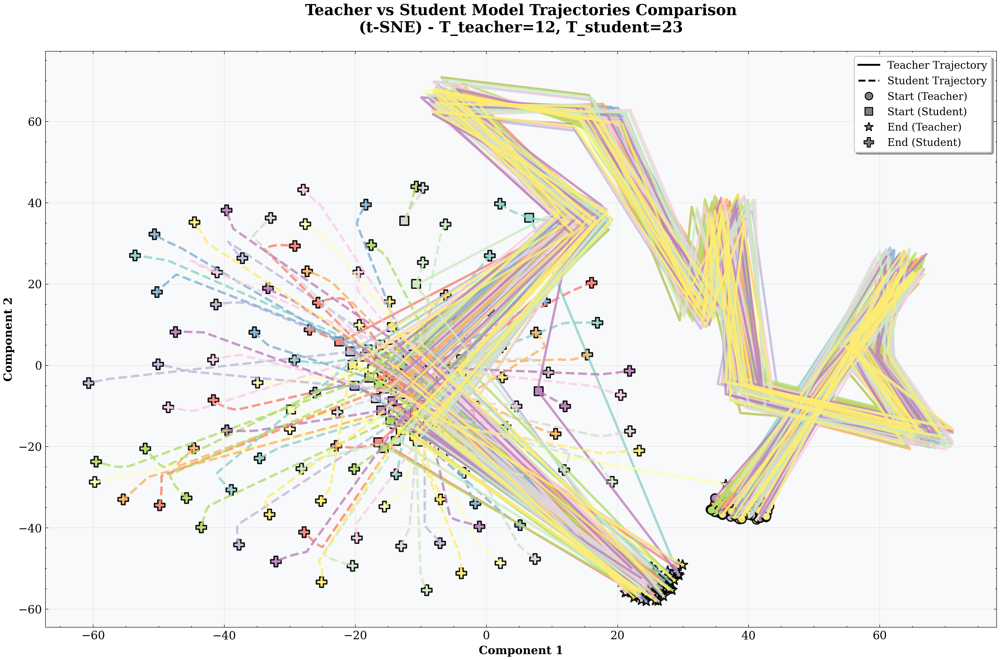

In [42]:
fig1 = plot_trajectories_comparison(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], reduction_method="tsne")

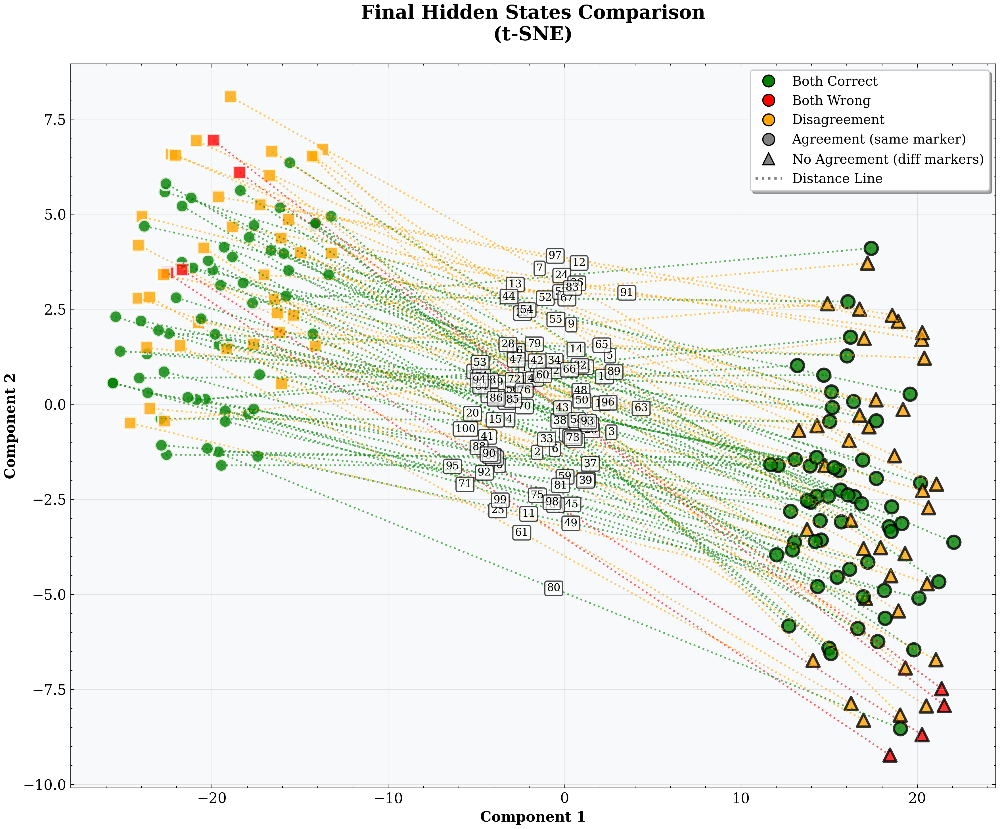

In [43]:
fig2 = plot_final_states_scatter(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement, reduction_method="tsne")

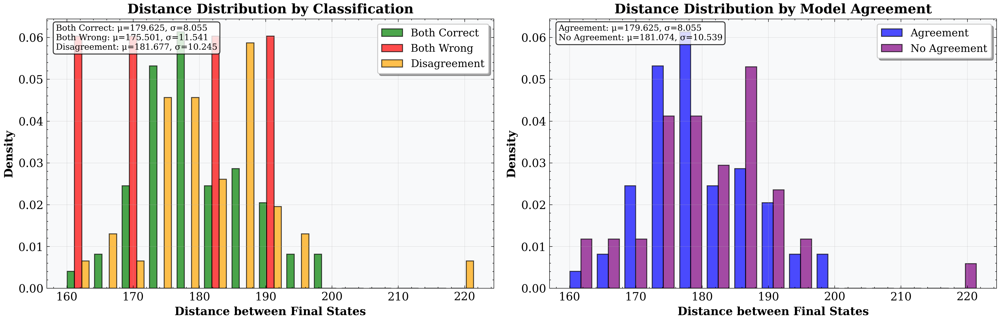

In [44]:
fig3 = plot_distance_distributions(teacher_trajectories[:, 1:, :], trajectories[:, 1:, :], acc_t, acc_edo, aggrement)